### Submitted by: Simran Joharle, Sachin Gupta and Bhavesh Rajpoot

# Sheet 3

## 1. Rand Index and Variation of Information

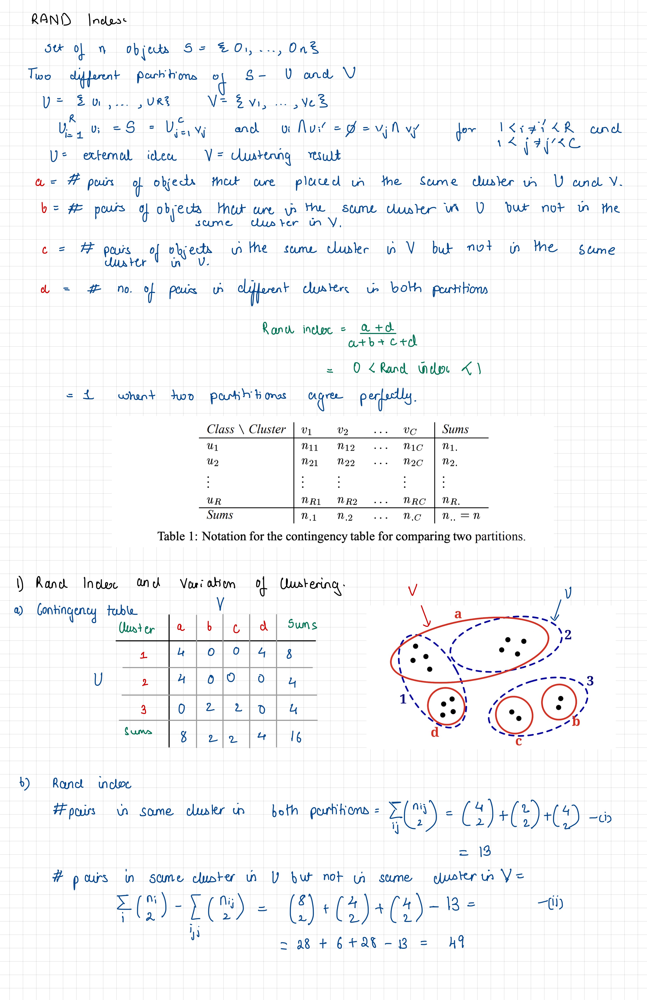

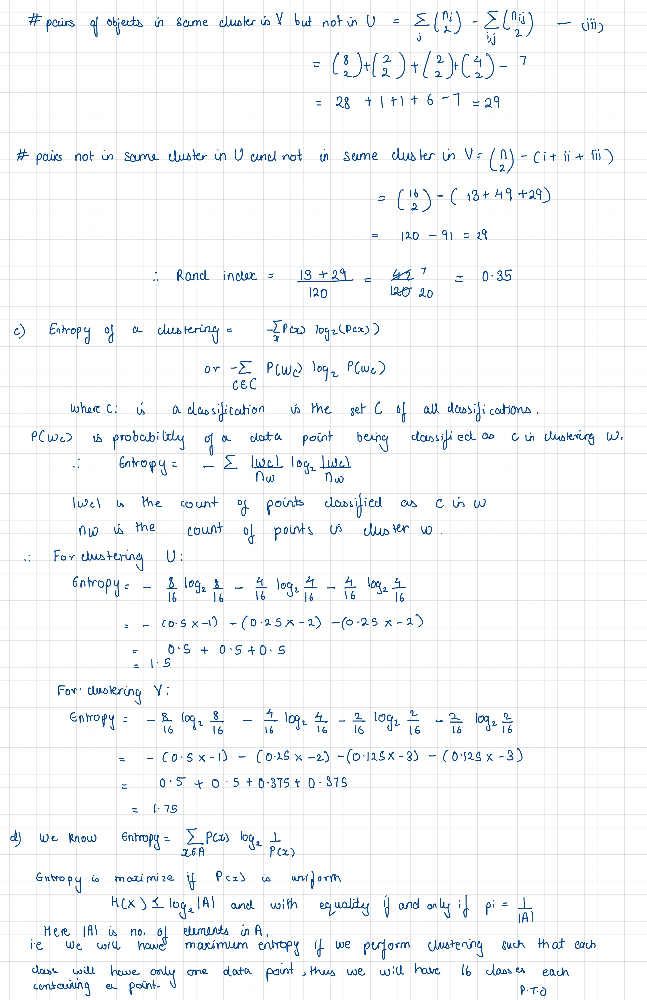

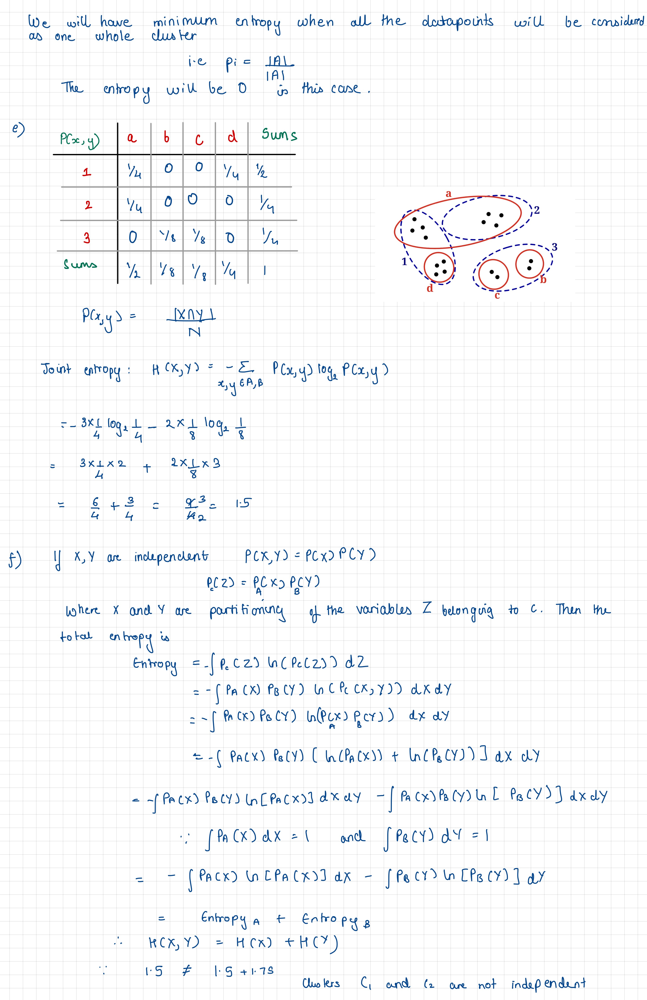

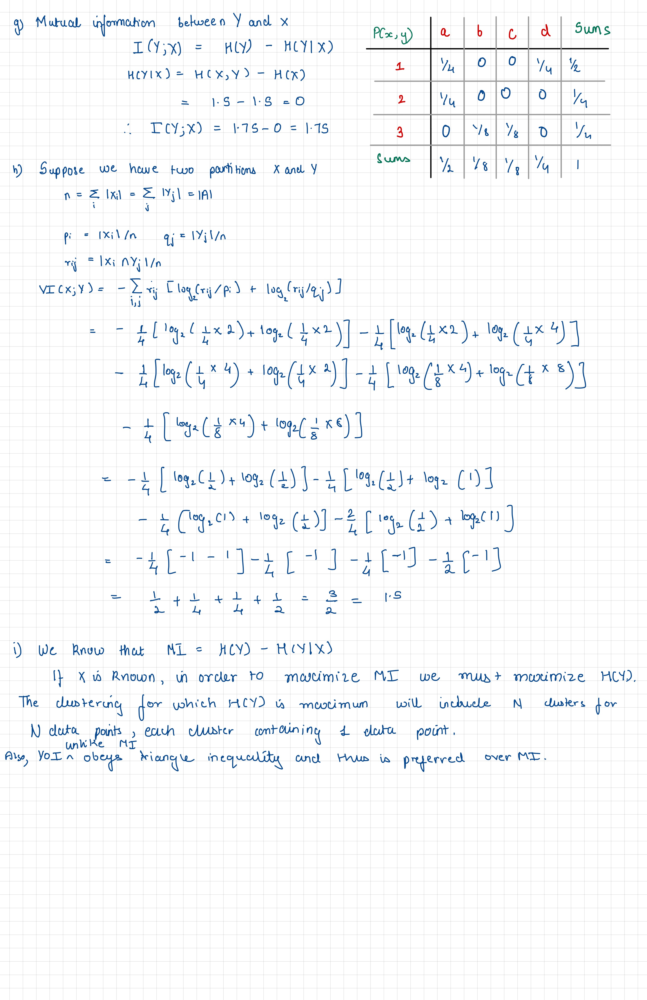

In [16]:
from IPython.display import Image, display


im = [Image(filename=f'images/Rand_Index_Sheet{i}.jpg') for i in range(1,5)]
display(*im)

## 2 Similarity Measures on Jet Data Clusterings

### (a) For each of the clusterings saved in the rows of `dijet_clusters.npy`, create a contingency table comparing it to the partition corresponding to the ground-truth labels. Visualize them using Hinton plots (you can use the provided method or create your own) and interpret what you see.

load the ground truth labels and k-means partitions

In [1]:
import numpy as np
from matplotlib import pyplot as plt

from sklearn.metrics.cluster import contingency_matrix 

In [2]:
# the dijet labels, corresponding to bottom, charm, light quarks
labels = np.load('data/dijet_labels.npy')

# 5 rows, each corresponding to a k-means clustering with [2, 3, 5, 10, 20] clusters respectively
partitions = np.load('data/dijet_clusters.npy') 
ks = [2, 3, 5, 10, 20]

print(labels.shape, partitions.shape)

(2233,) (5, 2233)


define function to create a hinton plot from a contingency matrix

In [3]:
def hinton_plot(matrix, max_weight=None, ax=None):
    """
    Draw Hinton diagram for visualizing a weight matrix. 
    From https://matplotlib.org/3.1.1/gallery/specialty_plots/hinton_demo.html
    """
    ax = ax if ax is not None else plt.gca()

    if not max_weight:
        max_weight = 2 ** np.ceil(np.log(np.abs(matrix).max()) / np.log(2))
    
    ax.patch.set_facecolor('gray')
    ax.set_aspect('equal', 'box')
    ax.xaxis.set_major_locator(plt.NullLocator())
    ax.yaxis.set_major_locator(plt.NullLocator())

    for (x, y), w in np.ndenumerate(matrix):    
        color = 'white' if w > 0 else 'black'
        size = np.sqrt(np.abs(w) / max_weight)
        rect = plt.Rectangle([x - size / 2, y - size / 2], size, size,
                             facecolor=color, edgecolor=color)
        ax.add_patch(rect)

    ax.autoscale_view()
    ax.invert_yaxis()

[[ 15 984]
 [ 17 847]
 [369   1]]


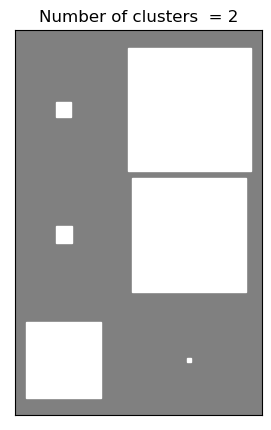

[[653   1 345]
 [552   1 311]
 [  6 360   4]]


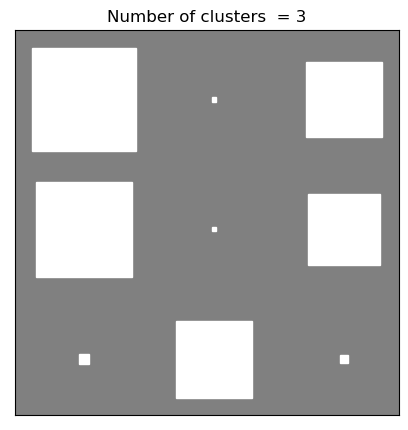

[[ 34 357 556   1  51]
 [ 14 294 545   1  10]
 [ 12   3   6 330  19]]


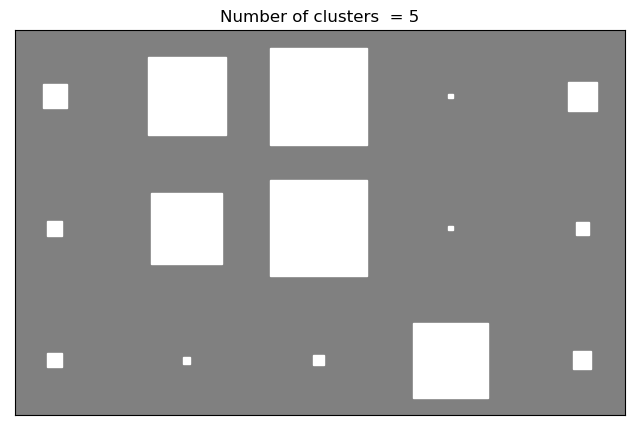

[[  0 210 160 125  79   3 133 204  51  34]
 [  0  85 204 113 108   4 135 191  10  14]
 [231   0   1  10   2  93   2   0  19  12]]


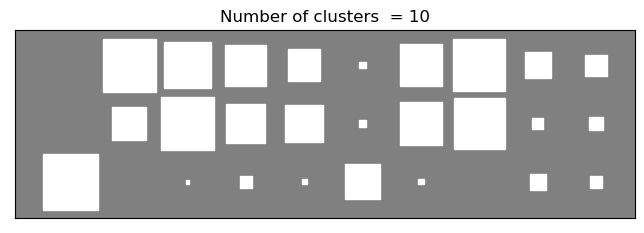

[[  0  48 109  85  82   0  73  56 140  32  51   7  77   0  42   0  49  34
    1 113]
 [  0  36  79  64  69   0  65  65 133  30  10  19  39   0  98   0  98  14
    0  45]
 [108   5   0   0   0 131   2   2   0   2  19  22   0  65   2   1   0  11
    0   0]]


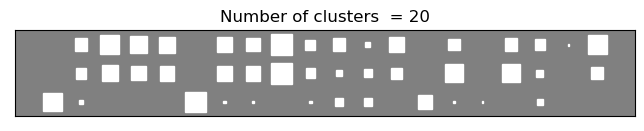

In [4]:
# TODO: compute the contingency matrices between labels and k-means partitions
#       (either implement your own or find the function in sklearn.metrics.cluster)


# TODO: visualize the contingency matrices via hinton plots and 
#       label the plots by the number of clusters used in k-means


cont_matrix = {2:np.array([]),3:np.array([]),5:np.array([]),10:np.array([]),20:np.array([])}   ##this array will store contigency matrix for all clusters

for i in range(len(ks)):  ##looping over all the clusters
    cont_matrix[ks[i]] = contingency_matrix(labels.T,partitions[i,:].T)  ##  calculating contigency matrix
    print(cont_matrix[ks[i]])
    fig, axs = plt.subplots(1, 1, figsize=(8, 5))   ##inittializing plot
    axs.set_title('Number of clusters  = '+str(ks[i]))

    hinton_plot(cont_matrix[ks[i]].T,max_weight=None,ax = axs)  ##passing the values 
    plt.show()

### Interpretation -


- For the first two plots we see that there is exactly one cluster which has more common points of **truth-label 2** and other clusters has common points with **truth label 0 and 1** in almost equal amounts.

- For the last three plots (ks =5, 10,20) we see some clusters like above explanation but there are other clusters which has mixed points of all labels with them.

### (b) Compute the Rand score, the adjusted Rand score, and the variation of information of the clusterings comparing them to the ground-truth clustering. Which clustering would you deem the best, and why?

In [9]:
from sklearn.metrics import rand_score, adjusted_rand_score, mutual_info_score, v_measure_score
iter=  0
for k, partition in zip(ks, partitions):

    Rand_score = rand_score(labels,partition)
    Adjusted_rand_score =  adjusted_rand_score(labels, partition)
    Mutual_info_score = mutual_info_score(labels,partition)
    V_measure_score = v_measure_score(labels,partition)

    print(f'{k=}, {Rand_score = :.3f}, {Adjusted_rand_score = :.3f}, {Mutual_info_score = :.3f}, {V_measure_score = :.3f}')


# TODO: compute and print the different scores as requested in the excercise

k=2, Rand_score = 0.648, Adjusted_rand_score = 0.361, Mutual_info_score = 0.395, V_measure_score = 0.529
k=3, Rand_score = 0.647, Adjusted_rand_score = 0.259, Mutual_info_score = 0.416, V_measure_score = 0.413
k=5, Rand_score = 0.641, Adjusted_rand_score = 0.228, Mutual_info_score = 0.393, V_measure_score = 0.352
k=10, Rand_score = 0.637, Adjusted_rand_score = 0.109, Mutual_info_score = 0.394, V_measure_score = 0.247
k=20, Rand_score = 0.631, Adjusted_rand_score = 0.061, Mutual_info_score = 0.404, V_measure_score = 0.211


### Which Clustering to choose ?

We see that first clustering outperforms from all other 4 in all scores. But Second Clustering( ks = 3) gives more mutual info than the first. 
However, when it comes to choosing the optimal clustering we should not only considers scores but some other performances as well.
Since we see that all clustering algorithms have clusters which have mixed number of first two quarks and some clusters only contain the last quarks.

If we now look at our first two clustering on the basis of such approach we see that the In the **2nd clustering algorithm(ks = 3)** second cluster(column two) agrees 360 times with the third quark and only *1* times each with first two quarks. Similarly In the  **1st clustering algorithm(ks = 2)** first cluster (first column) agrees 369 times but contains (15+17 = 32) first two quarks.

Hence when it comes to experimental analysis perspectives we will opt the second clustering with ks =3 :) 

## 3. Mutual Information for Image Matching

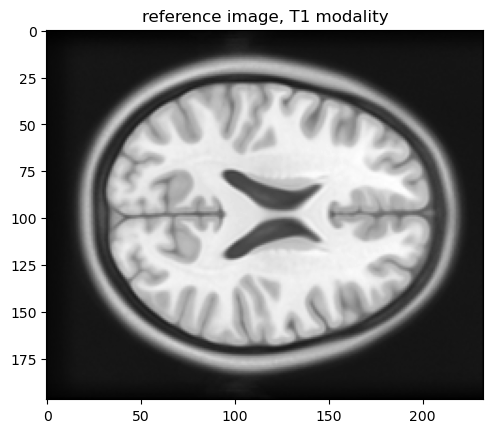

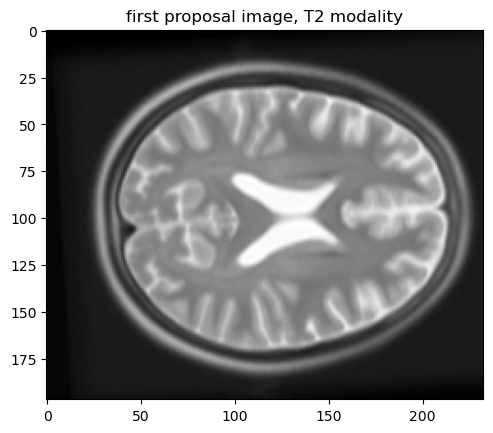

In [10]:
# load the reference image and the proposals
reference = np.load('data/t1_reference.npy')
proposals = np.load('data/t2_registration_proposals.npy')

plt.imshow(reference, cmap='gray')
plt.title('reference image, T1 modality')
plt.show();

plt.imshow(proposals[0], cmap='gray')
plt.title('first proposal image, T2 modality')
plt.show();

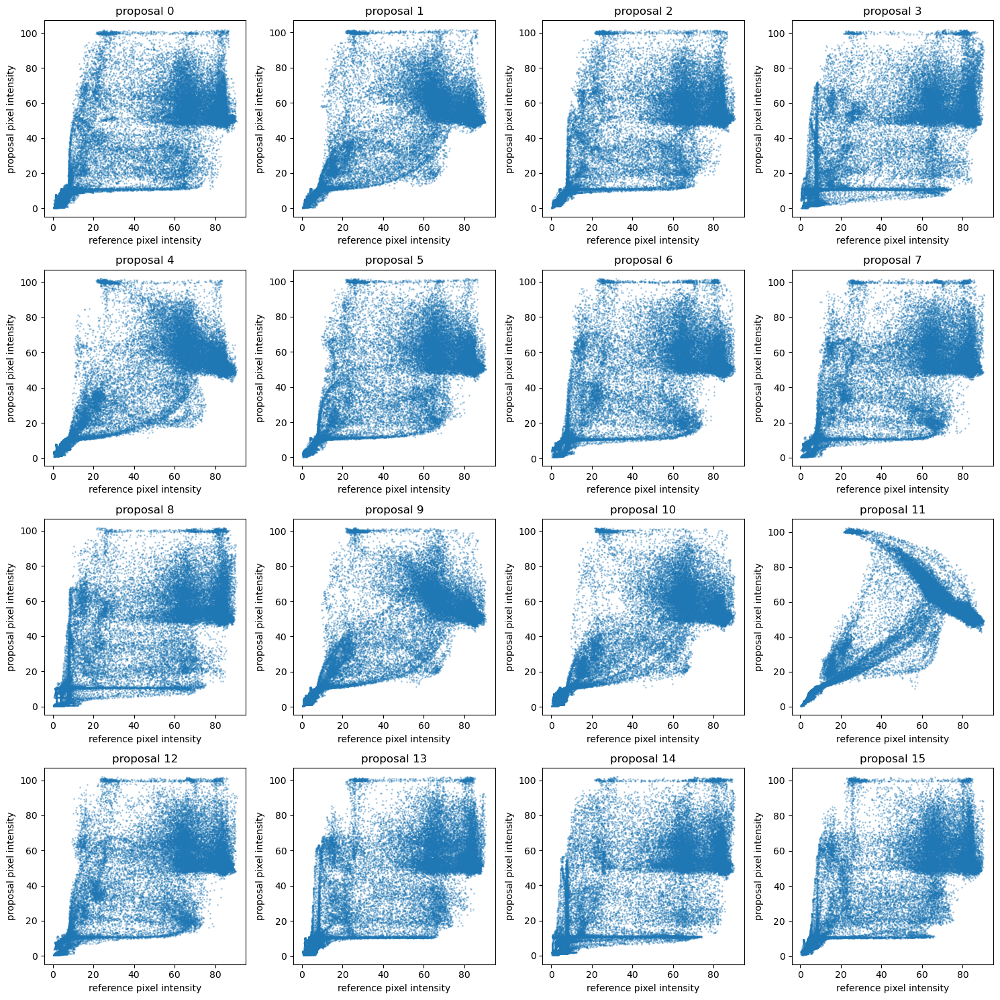

In [11]:
# create 16 subplots in order to plot all proposals in one figure
fig, axs = plt.subplots(4, 4, figsize=(15, 15)) 

for i, (ax, proposal) in enumerate(zip(axs.flatten(), proposals)):
    # TODO: make a scatterplot of the reference pixel intensities vs the pixel intensities in the i-th proposal
    #       do not forget to label the axes
    ax.scatter(reference,proposal,s=1,alpha=0.3)
    ax.set_xlabel("reference pixel intensity")
    ax.set_ylabel("proposal pixel intensity")
    ax.set_title(f'proposal {i}')
plt.tight_layout()
plt.show();

#### Qualitative differences in reference and proposals:
 - We see that the both the images do not have sam intensities and the same respective pixel position. If this would have been the case all the points would have been along the diagonal of the plot.
 - From the spreadof the points we can see that at lower pixel values of reference image we have higher intensity at the correspoinding pixel in the proposal image and this is seen vice versa too. This explains the general inversion of intensity as seen in the plots in previous cell.
 - We also see an overdensity at the top right part of the graph, which shows that for high intensity values in the reference images, the pixels in the proposal image have almost a constant intensity lying between 60 to 40. It may also show misalignment of images
 - Both the images agree at exteremely low intensities which correspond to the pixels in the black background of the two images.

(b)

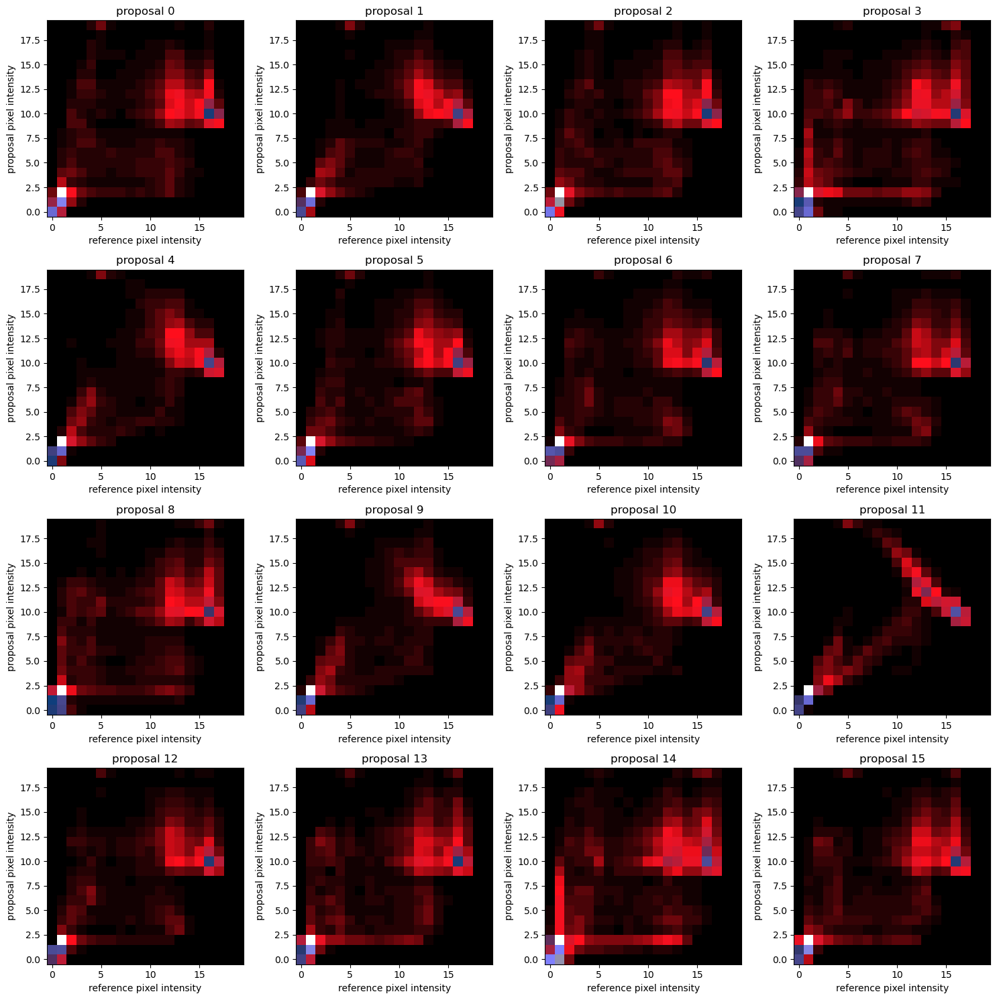

In [23]:
# TODO: For each proposal, create a 2D histograms of pixel intensities of it and the reference 
#       (Choose a sensible range and bins for the histogram)
# Hint: np.histogram2d, flatten the arrays as pixel positions don't matter

# def bin_count(arr):
#     '''
#     Calculates the optimal bin counts using Friedman-Draconis rule
#     '''
#     q1 = np.quantile(arr,0.25)
#     q3 = np.quantile(arr,0.75)
#     iqr = q3 - q1
#     bin_width = (2 * iqr) / (len(arr) ** (1 / 3))
#     bin_count = int(np.ceil((np.max(arr) - np.min(arr)) / bin_width))
#     return bin_count

# print(bin_count(reference.flatten()))
# print(bin_count(proposal.flatten()))
# histograms = [np.histogram2d(reference.flatten(),proposal.flatten(),range=((0,100),(0,100)),bins=[bin_count(reference.flatten()),bin_count(proposal.flatten())])[0] for proposal in proposals]


histograms = [np.histogram2d(reference.flatten(),proposal.flatten(),range=((0,100),(0,100)),bins=20, normed=False)[0] for proposal in proposals] 

# TODO: plot the histograms

# create 16 subplots in order to plot all proposals in one figure
fig, axs = plt.subplots(4, 4, figsize=(15, 15)) 

for i, (ax, hist) in enumerate(zip(axs.flatten(), histograms)):
    # TODO: plot the histogram for the i'th proposal. 
    # mean = np.mean(hist.T)
    # sigma = np.std(hist.T)
    # ax.imshow(hist.T, origin='lower',vmax=mean+(3*sigma),vmin=mean-(3*sigma),cmap='gray')
    ax.imshow(hist.T,origin='lower',cmap='gist_stern')
    ax.set_xlabel("reference pixel intensity")
    ax.set_ylabel("proposal pixel intensity")
    ax.set_title(f'proposal {i}')
    
plt.tight_layout()
plt.show();

In [8]:
from sklearn.metrics import mutual_info_score as mi

# TODO: for each histogram, compute the mutual information score
MI = np.array([mi(labels_true=reference,labels_pred=proposal,contingency=hist)for (hist,proposal) in zip(histograms,proposals)])
# TODO: order the proposal by MI, plot them in this order and include the scores in the titles of the plots.
sort_ind = np.argsort(MI)[::-1]



### Plotting from highest MI to lowest MI

## Tutor comment:

- plot ref, prop, and overly ((ref+prop)/2) together with score as title

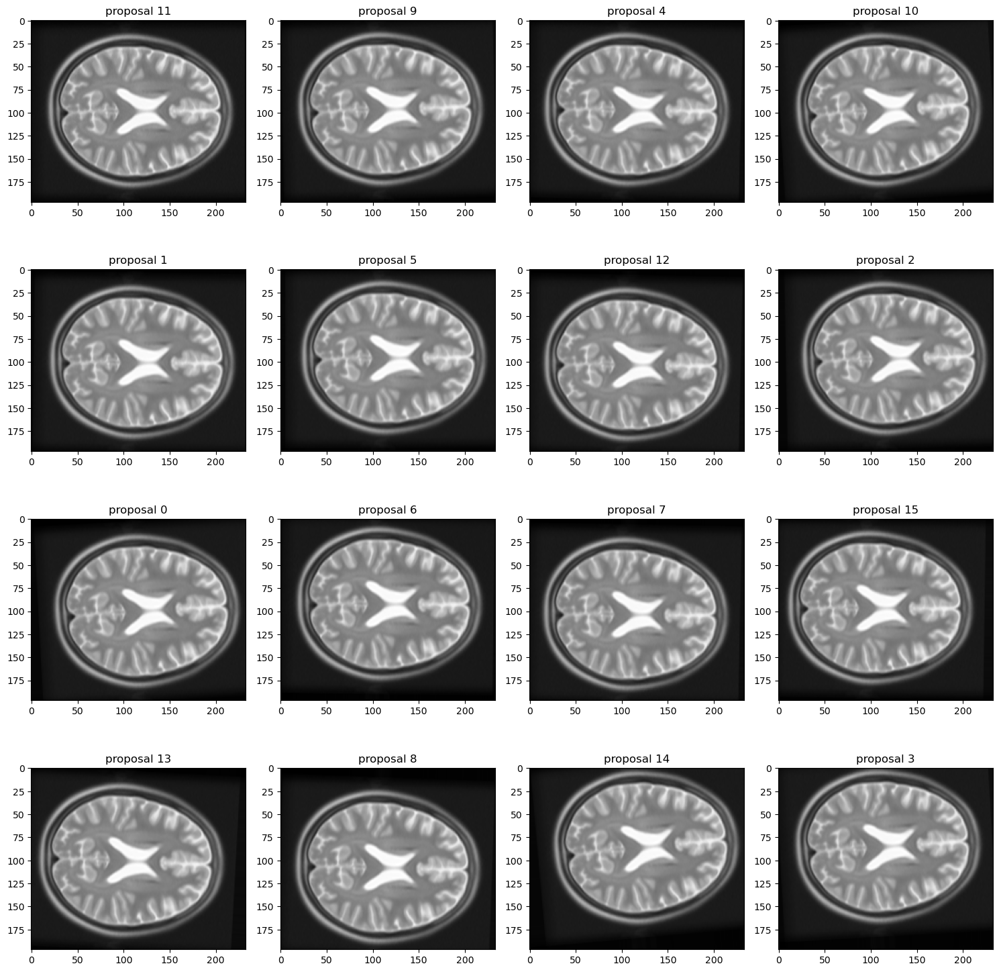

In [9]:
fig, axs = plt.subplots(4, 4, figsize=(15, 15)) 

for j, (ax, i) in enumerate(zip(axs.flatten(), sort_ind)):
    ax.imshow(proposals[i], cmap='gray')
    ax.set_title(f'proposal {i}')



plt.tight_layout()
plt.show();

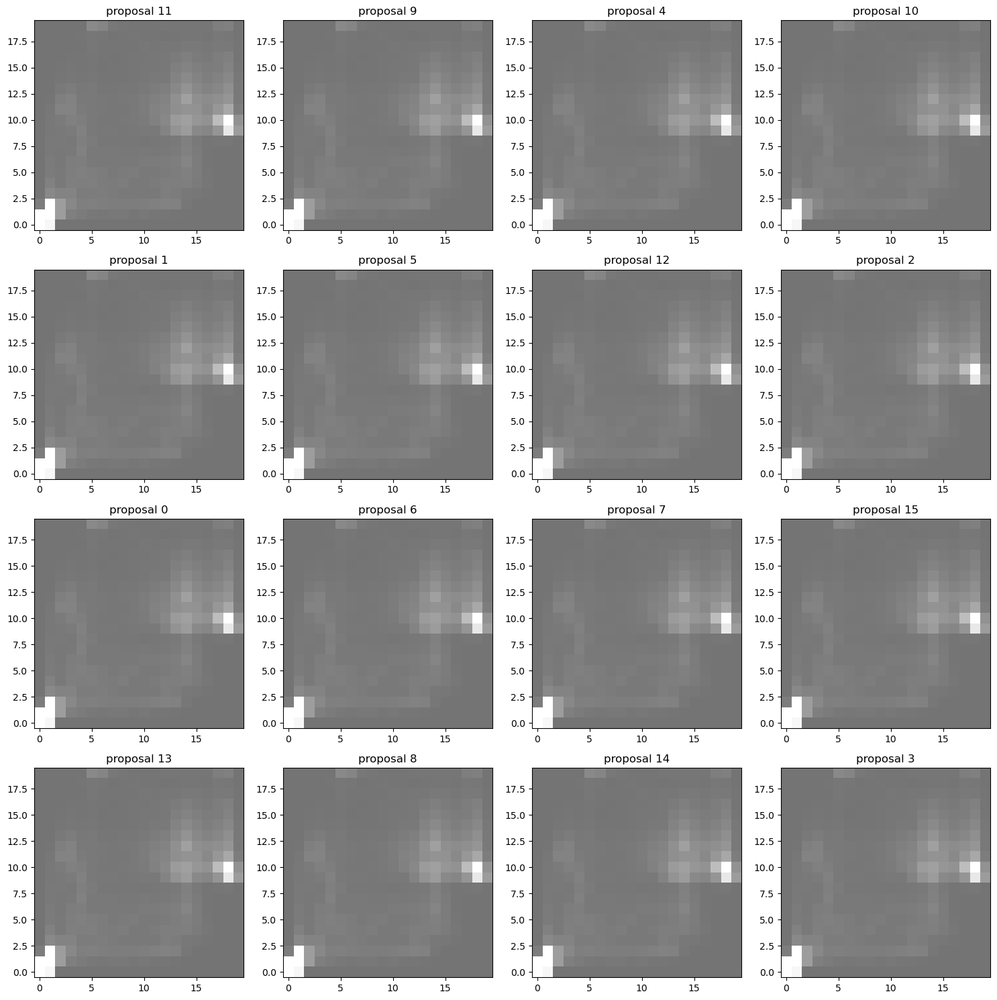

In [10]:
fig, axs = plt.subplots(4, 4, figsize=(15, 15)) 

for j, (ax, i) in enumerate(zip(axs.flatten(), sort_ind)):
    mean = np.mean(hist.T)
    sigma = np.std(hist.T)
    ax.imshow(hist.T, origin='lower',vmax=mean+(3*sigma),vmin=mean-(3*sigma),cmap='gray')
    ax.set_title(f'proposal {i}')
    
plt.tight_layout()
plt.show();

#### We know that Mutual information is a metric from the joint (2D) histogram. The metric is high when the signal is highly concentrated in few bins, and low when the signal is spread across many bins as seen in proposal 11. We see that for the proposals with lower MI the signal is less concentrated into a small number of bins, leading to the drop in the mutual information.